# Autoencoders

## Шаг 1
В этом ноутбуке мы будем тренировать автоэнкодеры кодировать лица людей. Для этого возьмем следующий датасет: "Labeled Faces in the Wild" (LFW) (http://vis-www.cs.umass.edu/lfw/). Вам нужно скачать оттуда lfw-deepfunneled.tgz и lfw_attributes.txt. Архив .tgz нужно распаковать =) После этого у вас появится папка с папками с лицами людей.

P.S. Не забудьте разбить выборку на train и test (нет, не в отдельные папки, а при загрузке в память компьютера в ноутбуке =))

P.P.S. для улучшения обучения автоэекодера полезно перевести величины пикселей картинки в отрезок [0, 1] (изначально они в интервале [0, 255]), а также привести их к типу float. Также удобно для начала сделать resize картинок в размер ~ (45, 45), чтобы обучить автоэнкодер было проще. Потом вы можете увеличить картинки как хотите, и усложнять вместе с ними автоэнкодер.

### Подготовка данных

Скачаем архив с картинками *lfw-deepfunneled.tgz*

In [0]:
!wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz

--2019-06-26 20:09:28--  http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz
Resolving vis-www.cs.umass.edu (vis-www.cs.umass.edu)... 128.119.244.95
Connecting to vis-www.cs.umass.edu (vis-www.cs.umass.edu)|128.119.244.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 108761145 (104M) [application/x-gzip]
Saving to: ‘lfw-deepfunneled.tgz’

lfw-deepfunneled.tg 100%[===================>] 103.72M  27.7MB/s    in 5.1s    

2019-06-26 20:09:34 (20.4 MB/s) - ‘lfw-deepfunneled.tgz’ saved [108761145/108761145]



Скачаем файл *lfw_attributes.txt*

In [0]:
!wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/lfw_attributes.txt #http://vis-www.cs.umass.edu/lfw/lfw_attributes.txt

--2019-06-26 20:09:39--  http://www.cs.columbia.edu/CAVE/databases/pubfig/download/lfw_attributes.txt
Resolving www.cs.columbia.edu (www.cs.columbia.edu)... 128.59.11.206
Connecting to www.cs.columbia.edu (www.cs.columbia.edu)|128.59.11.206|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14879205 (14M) [text/plain]
Saving to: ‘lfw_attributes.txt’

lfw_attributes.txt  100%[===================>]  14.19M  16.0MB/s    in 0.9s    

2019-06-26 20:09:40 (16.0 MB/s) - ‘lfw_attributes.txt’ saved [14879205/14879205]



Распакуем архив

In [0]:
!tar -xvzf lfw-deepfunneled.tgz

lfw-deepfunneled/AJ_Cook/AJ_Cook_0001.jpg
lfw-deepfunneled/AJ_Lamas/AJ_Lamas_0001.jpg
lfw-deepfunneled/Aaron_Eckhart/Aaron_Eckhart_0001.jpg
lfw-deepfunneled/Aaron_Guiel/Aaron_Guiel_0001.jpg
lfw-deepfunneled/Aaron_Patterson/Aaron_Patterson_0001.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0001.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0002.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0003.jpg
lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0004.jpg
lfw-deepfunneled/Aaron_Pena/Aaron_Pena_0001.jpg
lfw-deepfunneled/Aaron_Sorkin/Aaron_Sorkin_0001.jpg
lfw-deepfunneled/Aaron_Sorkin/Aaron_Sorkin_0002.jpg
lfw-deepfunneled/Aaron_Tippin/Aaron_Tippin_0001.jpg
lfw-deepfunneled/Abba_Eban/Abba_Eban_0001.jpg
lfw-deepfunneled/Abbas_Kiarostami/Abbas_Kiarostami_0001.jpg
lfw-deepfunneled/Abdel_Aziz_Al-Hakim/Abdel_Aziz_Al-Hakim_0001.jpg
lfw-deepfunneled/Abdel_Madi_Shabneh/Abdel_Madi_Shabneh_0001.jpg
lfw-deepfunneled/Abdel_Nasser_Assidi/Abdel_Nasser_Assidi_0001.jpg
lfw-deepfunneled/Abdel_Nasser_

Будем работать с изображениями размера (64, 64, 3)



In [0]:
# Зададим желаемый размер изображений
img_rows, img_cols = 64, 64 # Окончательный размер (после кропа)
rows, cols = 172, 172 # Начальный размер (до кропа)
crop_dx, crop_dy = 54, 54 # Отступы по ширине и высоте для центрального кропа
# И размер батча
batch_size = 128
seed = 12

С помощью датагенератора соберем датасеты для обучения и для валидации

In [0]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import numpy as np

Using TensorFlow backend.


In [0]:
all_datagen  = ImageDataGenerator(
        # Приводим значения к отрезку [0, 1]
        rescale=1./255.,
        # Указываем коэффициент для разделения выборки на train и val
        validation_split=0.25
        )

train_generator_ = all_datagen.flow_from_directory(
        # Изображения берем из папки, в которую только что распаковали архив
        '/content/lfw-deepfunneled/',
        # Приводим к нужному размеру
        # target_size=(img_rows, img_cols), # было до 22.06.2019
        target_size=(rows, cols), # стало после 22.06.2019 (по расчету центральная часть размера 64 на 64 и будет лицом)
        # Задаем размер батча
        batch_size=batch_size,
        # Метки классов не нужны
        class_mode=None,
        # Перемешиваем
        shuffle=True,
        # Указываем, что берем только отобранные для обучения изображения
        subset='training',
        seed=seed
        )

val_generator_ = all_datagen.flow_from_directory(
        # Изображения берем из папки, в которую только что распаковали архив
        '/content/lfw-deepfunneled/',
        # Приводим к нужному размеру
        #target_size=(img_rows, img_cols), # было до 22.06.2019
        target_size=(rows, cols), # стало после 22.06.2019
        # Задаем размер батча
        batch_size=batch_size,
        # Метки классов не нужны
        class_mode=None,
        # Не перемешиваем
        shuffle=False,
        # Указываем, что берем только отобранные для валидации изображения
        subset='validation',
        seed=seed
        )

Found 11705 images belonging to 5749 classes.
Found 1528 images belonging to 5749 classes.


Так как нужна только центральная часть изображений (лицо), делаем новый генератор с центральным кропом





In [0]:
def crop_generator(batches, crop_length=(54, 54)):
  while 1:
    batch_x = batches.next()
    dx, dy = crop_length
    batch_x = batch_x[:,dx:-dx,dy:-dy]    
    yield (batch_x)

In [0]:
train_generator = crop_generator(train_generator_, crop_length=(crop_dx, crop_dy))
val_generator = crop_generator(val_generator_, crop_length=(crop_dx, crop_dy))

Проверим размеры одного батча

In [0]:
x = next(train_generator)

In [0]:
x.shape

(128, 64, 64, 3)

Выведем несколько изображений

In [0]:
import matplotlib.pyplot as plt

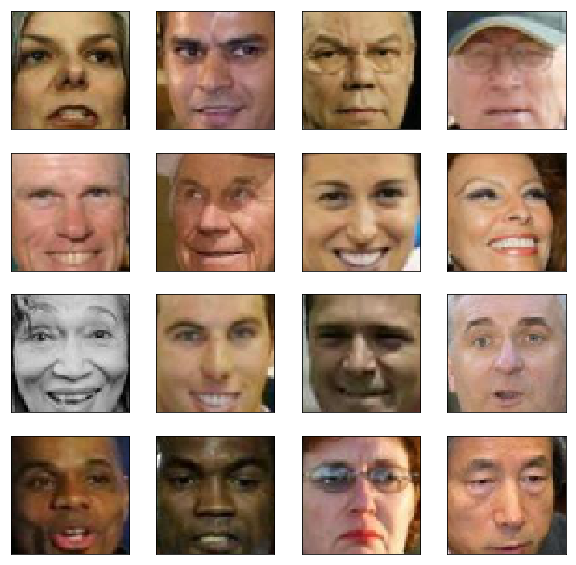

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x[i])

Данные готовы!

## Шаг 2

Пока скачивается датасет, можно набросать план действий:

Разботать и реализовать автоэнкодер. Обычный (как на картинке)
<img src="https://i.imgur.com/nVJAtMT.png" alt="Autoencoder">

Вектор в середине (выход ancoder'а) называется латентным вектором/представлением картинки.

Для начала стоит почитать статьи/посты про автоэнкодеры. Автоэнкодер будет представлять собой класс-наследник nn.Module (как и обычно). Параметры типа кол-ва слоев, кол-ва нейронов в каждом слое и прочие советую вынести в отдельные переменные, чтобы потом было проще менять (вряд ли вы сразу угадаете, сколько слоев/нейронов вам нужно). Ну и, собственно, натренировать автоэекодер =) 

В процессе тренировки автоэекодера полезно следить не только за лоссом, но и за тем, как автоэнкодер восстанавливает каринки. Не поленитесь и напишите код, который каждую эпоху (например) будет прогонять через автоэнкодер несколько картинок из val выборки и выводить на экран полученные реконструкции.

P.S. какой будет структура автоэнкодера -- свертки, только fully-connected -- решать Вам. Можно заставить работать и так, и так. Эксперементируйте =) 

### Построение модели

In [0]:
# Подключим необходимые модули
from __future__ import print_function, division

from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Add, Multiply, Lambda, Layer
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, Conv2DTranspose, GlobalAveragePooling2D, ReLU
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras import backend as K
import sys

In [0]:
# Папка для сохранения (если нужно) изображений с реконструкциями во время обучения
!mkdir images

In [0]:
# Тестовый батч для отслеживания качества реконструкции во время обучения
x_test = next(val_generator)

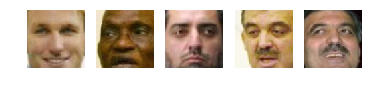

In [0]:
# Возьмем только 5 изображений, чтобы не захламлять вывод
r, c = 1, 5
fig, axs = plt.subplots(r, c)
for j in range(c):
  axs[j].imshow(x_test[j]) 
  axs[j].axis('off')
plt.show()

In [0]:
# Определим класс для автоэнкодера
class AE():
  
    def __init__(self):

        # Укажем размер картинок на входе и выходе
        self.img_rows = img_rows  
        self.img_cols = img_cols  
        self.channels = 3 
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        # И длину латентного вектора
        self.latent_dim = 768
        # Почему 768? В задании явно не указан размер латентного вектора 
        # А в силу моей архитектуры мне удобно было брать числа кратные 16*16=256
        # Но с 256 и 512 результат меня не устраивал, а вот 768 в самый раз

        # Строим энкодер
        # Вместо Pooling слоев используется Conv2D с strides=2 для уменьшения размера изображения
        input_img = Input(shape=self.img_shape)
        conv_1_1 = Conv2D(filters=128, kernel_size=5, strides=2, activation='relu', padding='same')(input_img)
        conv_1_2 = Conv2D(filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(conv_1_1)
        conv_1_3 = Conv2D(filters=3, kernel_size=3, strides=1, activation='relu', padding='same')(conv_1_2)
        fl = Flatten()(conv_1_3)
        # Без Dense слоев модель получается легче (меньше параметров)
        self.encoder = Model(input_img, fl)  
        self.encoder.summary()

        # Строим декодер
        # Вместо UpSampling слоев используется Conv2DTranspose с strides=2 для увеличения размера изображения
        latent_code = Input(shape=(self.latent_dim,))
        resh = Reshape((16,16,-1))(latent_code)
        conv_2_1 = Conv2DTranspose(filters=128, kernel_size=3, strides=2, activation='relu', padding='same')(resh)
        conv_2_2 = Conv2DTranspose(filters=128, kernel_size=4, strides=1, activation='relu', padding='same')(conv_2_1)
        conv_2_3 = Conv2DTranspose(filters=128, kernel_size=4, strides=2, activation='relu', padding='same')(conv_2_2)
        output = Conv2DTranspose(filters=3, kernel_size=5, activation='sigmoid', padding='same')(conv_2_3)
        self.decoder = Model(latent_code, output) 
        self.decoder.summary()
        
        # Строим автоэнкодер
        self.autoencoder = Model(input_img, self.decoder(self.encoder(input_img)))

        self.autoencoder.compile(loss='binary_crossentropy', optimizer='adam')
        self.autoencoder.summary()

    def train(self, epochs, save_imgs=False, sample_interval=100):

        train_losses = []
        val_losses = []

        for epoch in range(epochs):

            # Получаем батч картинок для обучения с помощью генератора
            imgs = next(train_generator)

            # Обучаем автоэнкодер (желаемый выход = вход) и запоминаем лосс
            d_loss = self.autoencoder.train_on_batch(imgs, imgs)
            train_losses.append(d_loss)

            # Получаем батч картинок для валидации с помощью генератора
            val_imgs = next(val_generator)
            
            # Считаем и запоминаем лосс
            g_loss = self.autoencoder.test_on_batch(val_imgs, val_imgs)
            val_losses.append(g_loss)

            # Если номер эпохи кратен sample_interval => 
            if epoch % sample_interval == 0:
                # Выводим лосс
                print ("%d [Train loss: %f] [Val loss: %f]" % (epoch, d_loss, g_loss))
                # Смотрим на получающиеся реконструкции 
                self.sample_images(epoch, save_imgs)
                
        return train_losses, val_losses

    def sample_images(self, epoch, save_imgs):
        # Получаем реконструкции для тестового батча
        y = self.autoencoder.predict(x_test[:5])
        # Выводим
        r, c = 2, 5
        fig, axs = plt.subplots(r, c)
        for j in range(c):
            axs[0, j].imshow(x_test[j]) 
            axs[0, j].axis('off')
            axs[1, j].imshow(y[j]) 
            axs[1, j].axis('off')
        plt.show()
        # При необходимости сохраняем в папку
        if save_imgs:
          fig.savefig("images/%d.png" % epoch)
          plt.close()

In [0]:
ae = AE()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 32, 32, 128)       9728      
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 16, 16, 128)       262272    
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 16, 16, 3)         3459      
_________________________________________________________________
flatten_13 (Flatten)         (None, 768)               0         
Total params: 275,459
Trainable params: 275,459
Non-trainable params: 0
_________________________________________________________________
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inpu

### Обучение автоэнкодера

0 [Train loss: 0.693117] [Val loss: 0.690100]


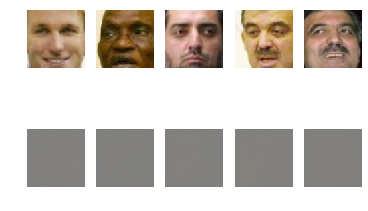

100 [Train loss: 0.607146] [Val loss: 0.611638]


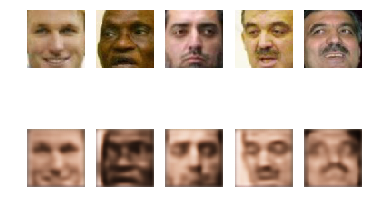

200 [Train loss: 0.595511] [Val loss: 0.602391]


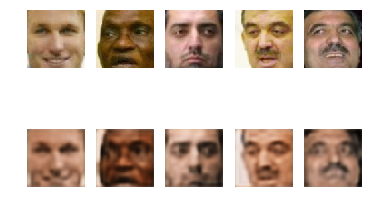

300 [Train loss: 0.601670] [Val loss: 0.598020]


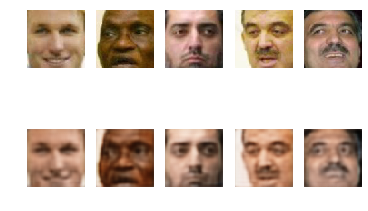

400 [Train loss: 0.593338] [Val loss: 0.600815]


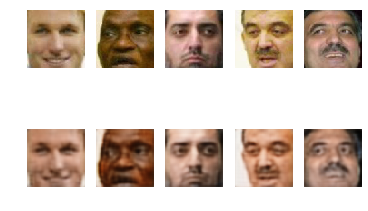

500 [Train loss: 0.599225] [Val loss: 0.600002]


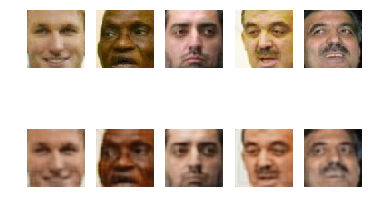

600 [Train loss: 0.587882] [Val loss: 0.595851]


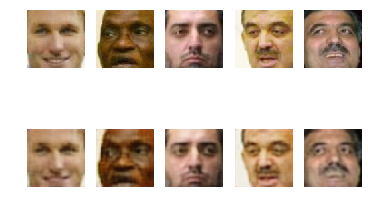

700 [Train loss: 0.596343] [Val loss: 0.600444]


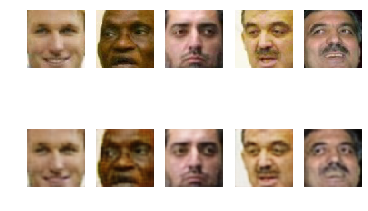

800 [Train loss: 0.583412] [Val loss: 0.596909]


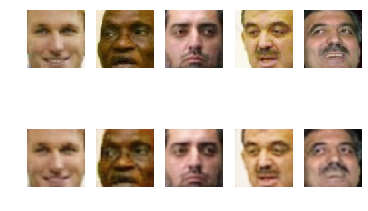

900 [Train loss: 0.591790] [Val loss: 0.595374]


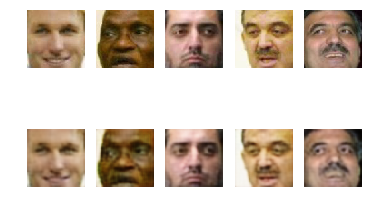

1000 [Train loss: 0.596698] [Val loss: 0.599660]


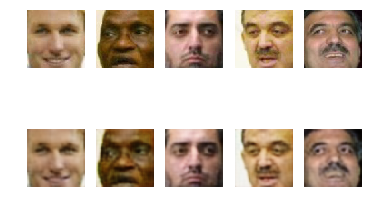

1100 [Train loss: 0.591731] [Val loss: 0.596515]


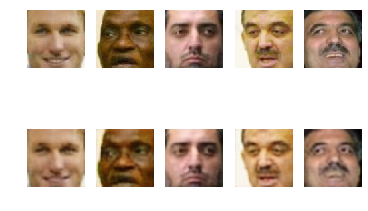

1200 [Train loss: 0.589487] [Val loss: 0.594899]


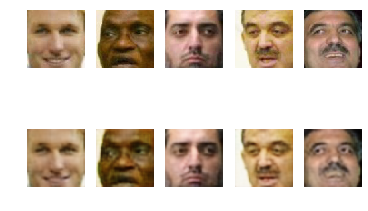

1300 [Train loss: 0.595482] [Val loss: 0.599348]


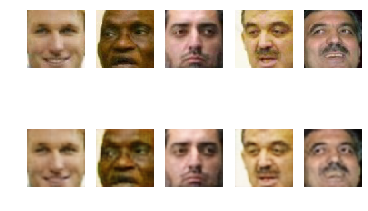

1400 [Train loss: 0.593091] [Val loss: 0.596156]


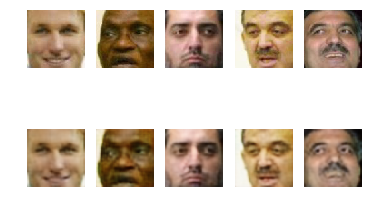

1500 [Train loss: 0.590179] [Val loss: 0.594841]


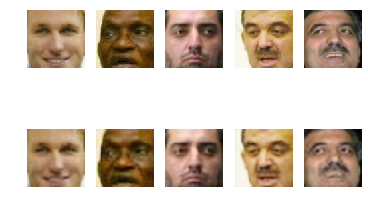

1600 [Train loss: 0.589580] [Val loss: 0.599015]


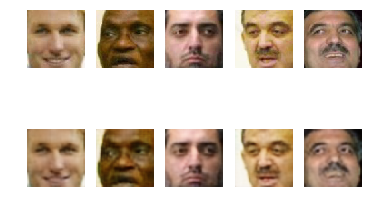

1700 [Train loss: 0.590130] [Val loss: 0.596209]


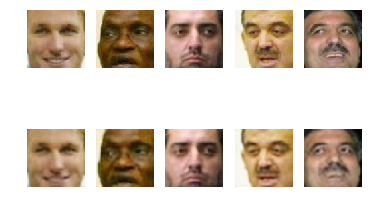

1800 [Train loss: 0.587976] [Val loss: 0.595472]


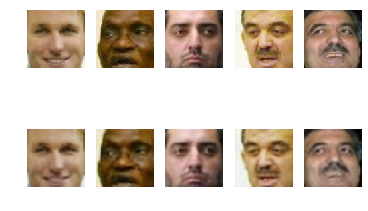

1900 [Train loss: 0.593300] [Val loss: 0.598860]


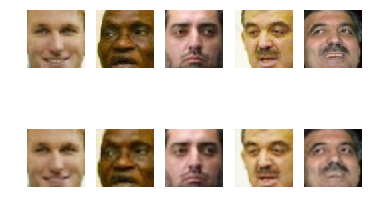

2000 [Train loss: 0.592822] [Val loss: 0.596021]


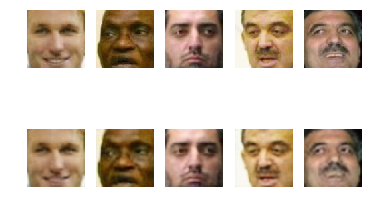

2100 [Train loss: 0.592734] [Val loss: 0.594713]


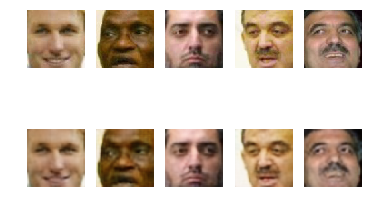

2200 [Train loss: 0.594248] [Val loss: 0.598918]


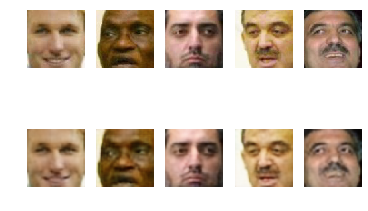

2300 [Train loss: 0.589951] [Val loss: 0.596281]


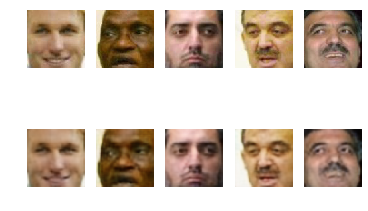

2400 [Train loss: 0.590888] [Val loss: 0.596755]


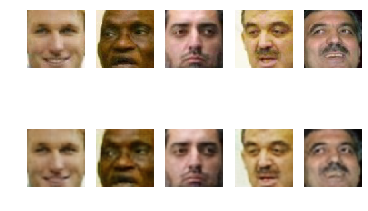

2500 [Train loss: 0.596693] [Val loss: 0.598781]


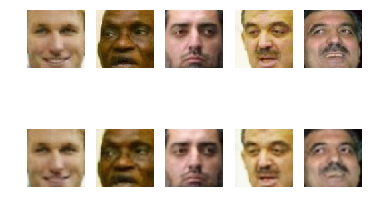

2600 [Train loss: 0.590864] [Val loss: 0.596300]


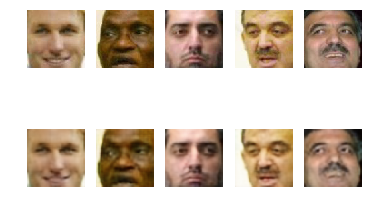

2700 [Train loss: 0.592987] [Val loss: 0.594983]


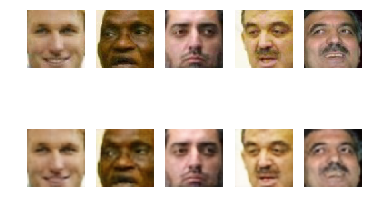

2800 [Train loss: 0.590059] [Val loss: 0.599323]


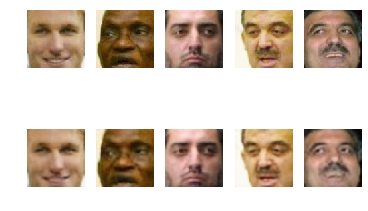

2900 [Train loss: 0.586605] [Val loss: 0.596110]


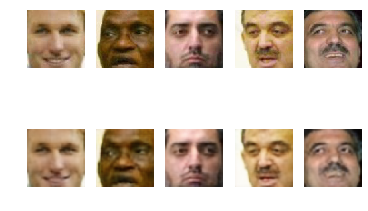

3000 [Train loss: 0.592192] [Val loss: 0.594483]


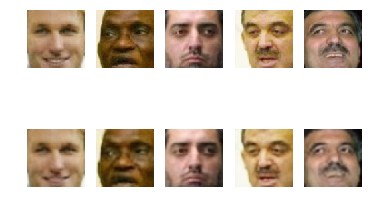

3100 [Train loss: 0.593002] [Val loss: 0.598851]


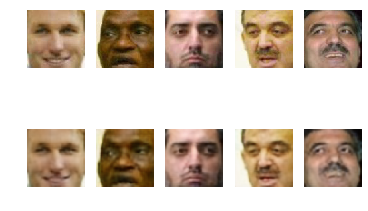

3200 [Train loss: 0.591437] [Val loss: 0.595834]


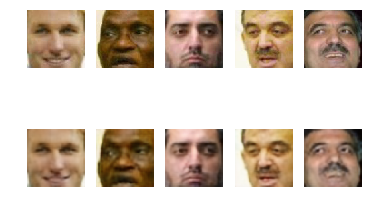

3300 [Train loss: 0.596419] [Val loss: 0.594456]


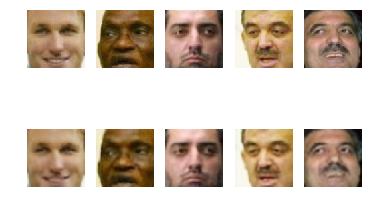

3400 [Train loss: 0.591590] [Val loss: 0.598901]


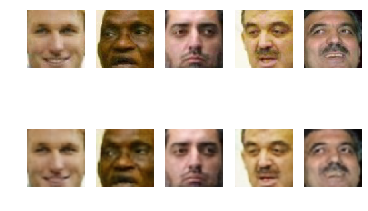

3500 [Train loss: 0.591673] [Val loss: 0.595841]


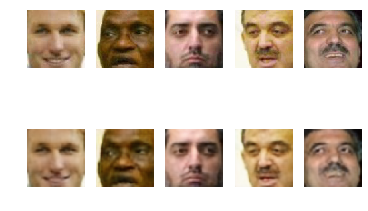

3600 [Train loss: 0.595476] [Val loss: 0.594530]


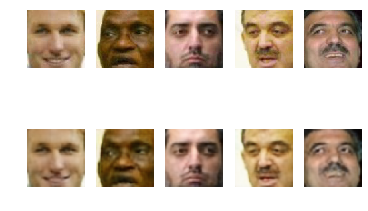

3700 [Train loss: 0.589800] [Val loss: 0.598814]


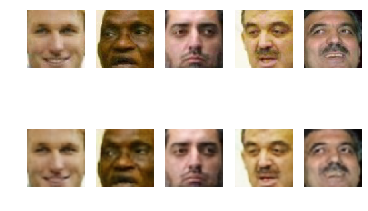

3800 [Train loss: 0.589959] [Val loss: 0.595966]


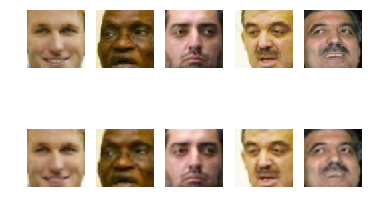

3900 [Train loss: 0.588055] [Val loss: 0.594416]


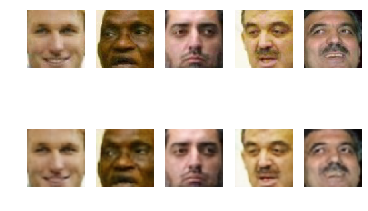

4000 [Train loss: 0.593949] [Val loss: 0.598835]


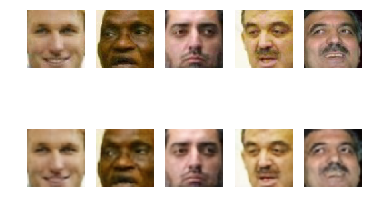

4100 [Train loss: 0.584607] [Val loss: 0.595809]


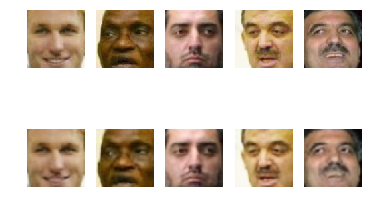

4200 [Train loss: 0.589406] [Val loss: 0.594471]


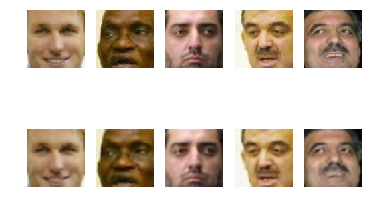

4300 [Train loss: 0.591338] [Val loss: 0.598674]


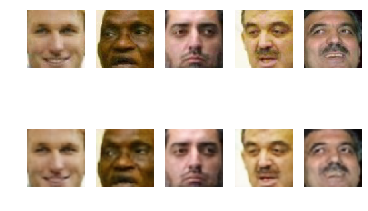

4400 [Train loss: 0.589265] [Val loss: 0.595774]


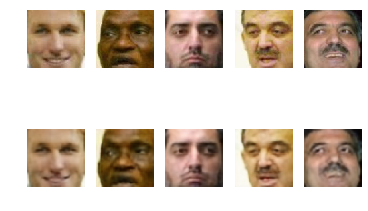

4500 [Train loss: 0.592715] [Val loss: 0.594391]


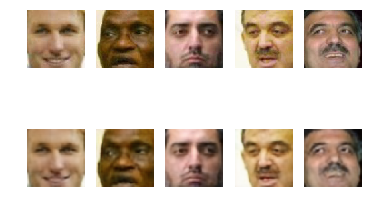

4600 [Train loss: 0.589866] [Val loss: 0.598600]


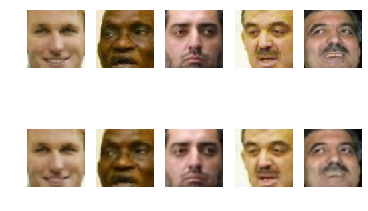

4700 [Train loss: 0.587723] [Val loss: 0.595833]


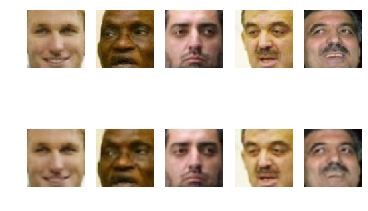

4800 [Train loss: 0.594166] [Val loss: 0.594850]


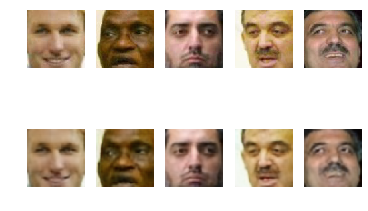

4900 [Train loss: 0.591708] [Val loss: 0.598653]


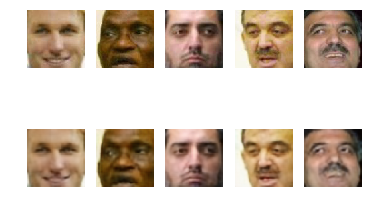

5000 [Train loss: 0.585570] [Val loss: 0.595698]


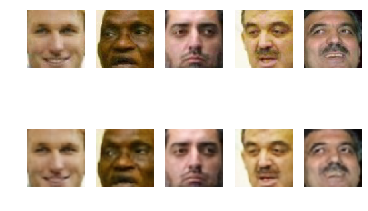

5100 [Train loss: 0.587400] [Val loss: 0.594596]


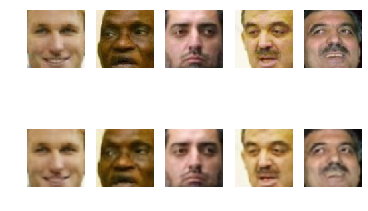

5200 [Train loss: 0.584430] [Val loss: 0.598977]


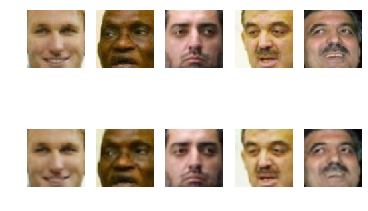

5300 [Train loss: 0.591225] [Val loss: 0.595820]


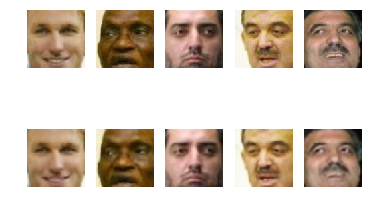

5400 [Train loss: 0.591426] [Val loss: 0.594466]


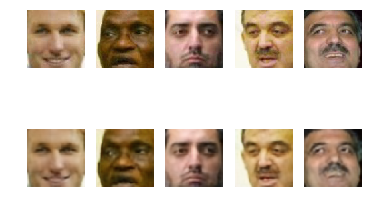

5500 [Train loss: 0.590999] [Val loss: 0.598858]


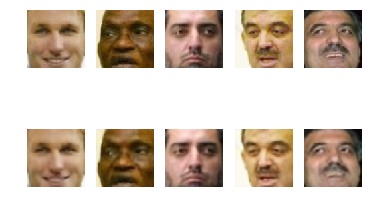

5600 [Train loss: 0.593835] [Val loss: 0.595702]


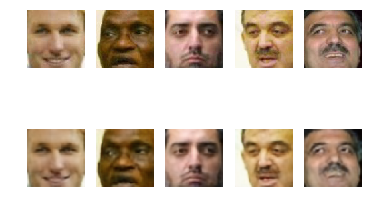

5700 [Train loss: 0.590934] [Val loss: 0.594338]


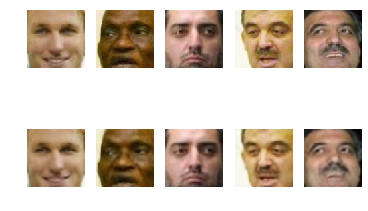

5800 [Train loss: 0.589992] [Val loss: 0.598696]


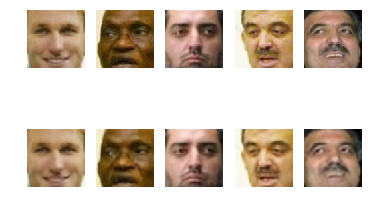

5900 [Train loss: 0.587709] [Val loss: 0.595662]


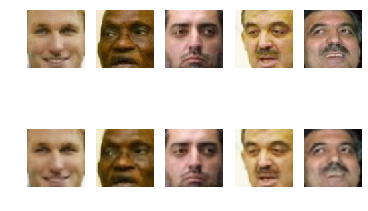

6000 [Train loss: 0.592321] [Val loss: 0.594320]


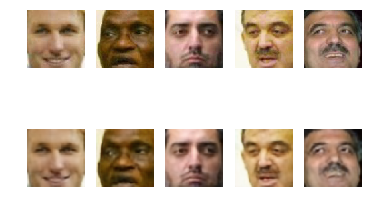

6100 [Train loss: 0.587661] [Val loss: 0.598665]


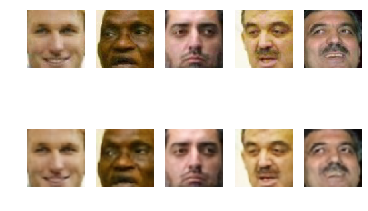

6200 [Train loss: 0.589334] [Val loss: 0.595887]


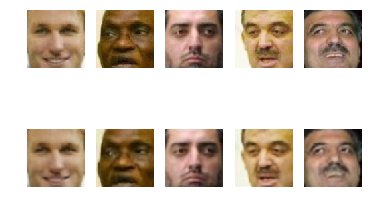

6300 [Train loss: 0.596601] [Val loss: 0.594276]


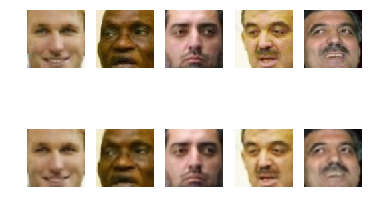

6400 [Train loss: 0.587800] [Val loss: 0.598997]


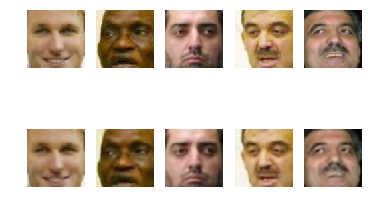

6500 [Train loss: 0.593859] [Val loss: 0.595656]


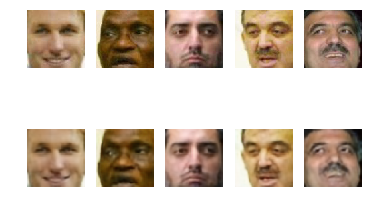

6600 [Train loss: 0.592349] [Val loss: 0.594383]


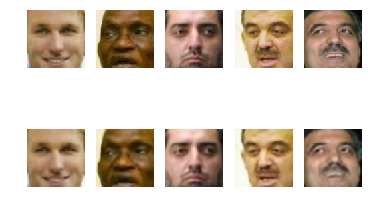

6700 [Train loss: 0.588273] [Val loss: 0.598759]


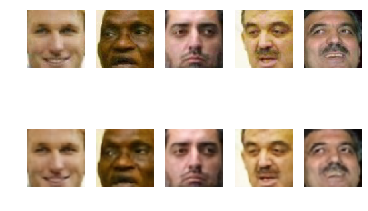

6800 [Train loss: 0.586628] [Val loss: 0.595625]


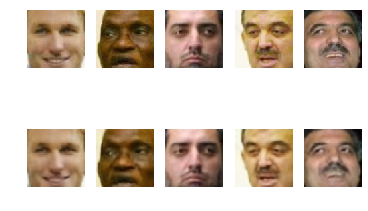

6900 [Train loss: 0.589204] [Val loss: 0.594652]


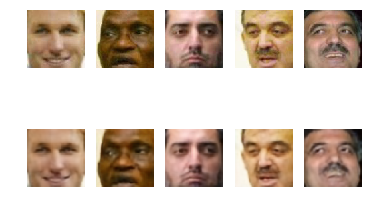

7000 [Train loss: 0.590545] [Val loss: 0.598480]


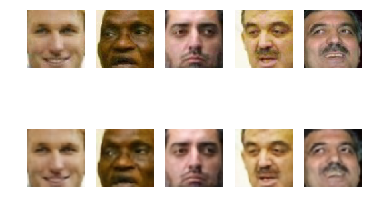

7100 [Train loss: 0.588381] [Val loss: 0.595845]


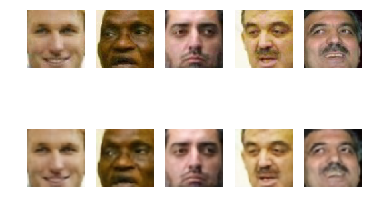

7200 [Train loss: 0.591060] [Val loss: 0.594588]


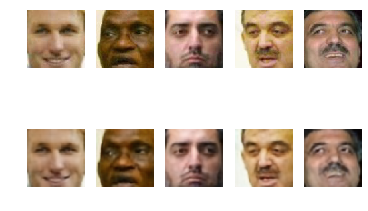

7300 [Train loss: 0.586491] [Val loss: 0.598461]


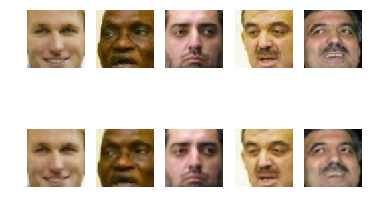

7400 [Train loss: 0.590904] [Val loss: 0.595664]


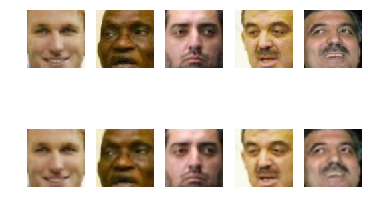

7500 [Train loss: 0.588513] [Val loss: 0.594366]


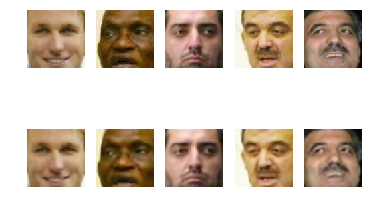

7600 [Train loss: 0.589007] [Val loss: 0.598485]


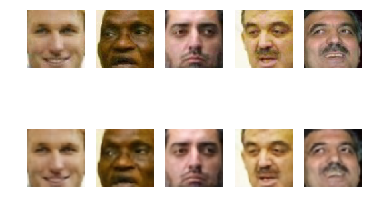

7700 [Train loss: 0.588102] [Val loss: 0.595606]


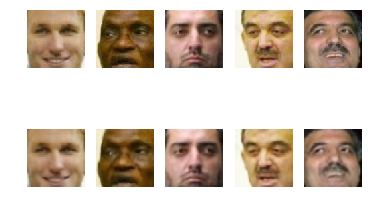

7800 [Train loss: 0.585447] [Val loss: 0.595160]


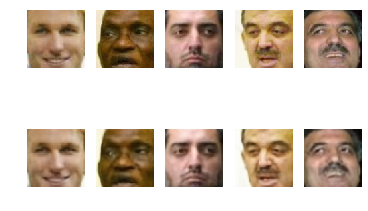

7900 [Train loss: 0.594310] [Val loss: 0.598582]


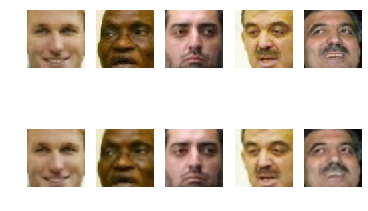

8000 [Train loss: 0.593810] [Val loss: 0.595587]


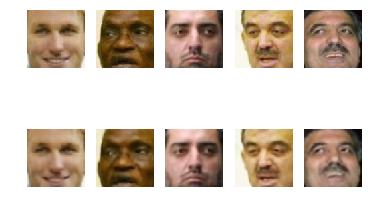

8100 [Train loss: 0.591796] [Val loss: 0.594224]


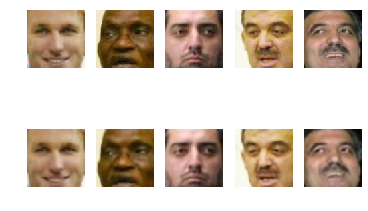

8200 [Train loss: 0.593883] [Val loss: 0.598820]


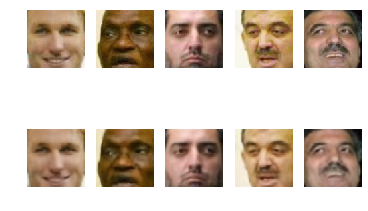

8300 [Train loss: 0.593186] [Val loss: 0.595580]


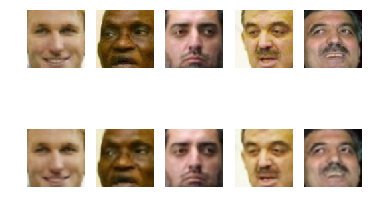

8400 [Train loss: 0.594391] [Val loss: 0.594456]


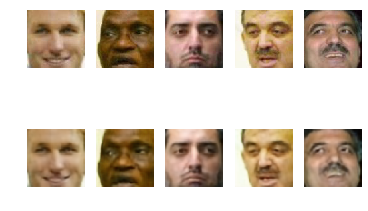

8500 [Train loss: 0.587727] [Val loss: 0.598494]


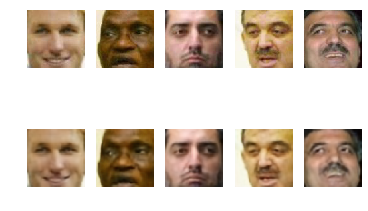

8600 [Train loss: 0.589696] [Val loss: 0.595631]


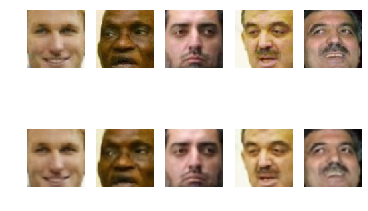

8700 [Train loss: 0.589081] [Val loss: 0.594228]


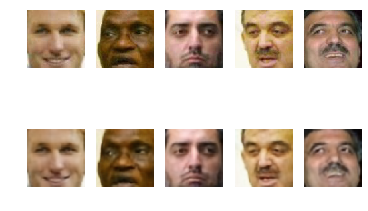

8800 [Train loss: 0.590762] [Val loss: 0.598482]


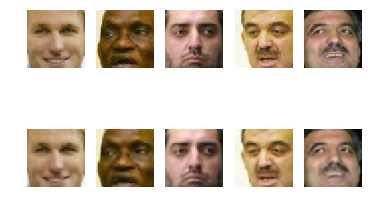

8900 [Train loss: 0.593851] [Val loss: 0.595719]


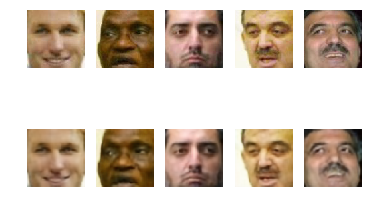

9000 [Train loss: 0.584814] [Val loss: 0.594240]


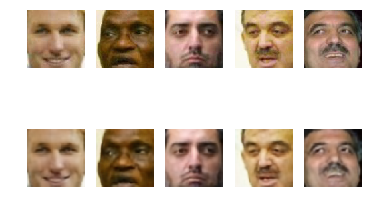

9100 [Train loss: 0.588979] [Val loss: 0.598455]


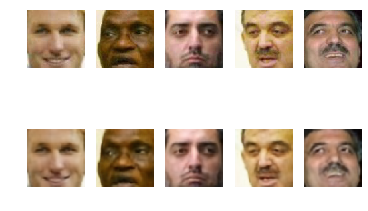

9200 [Train loss: 0.589302] [Val loss: 0.595707]


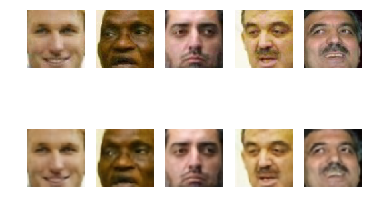

9300 [Train loss: 0.590834] [Val loss: 0.594307]


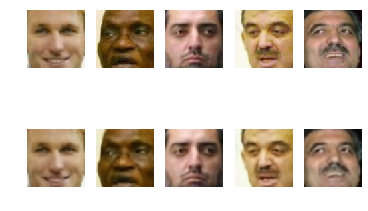

9400 [Train loss: 0.585824] [Val loss: 0.598423]


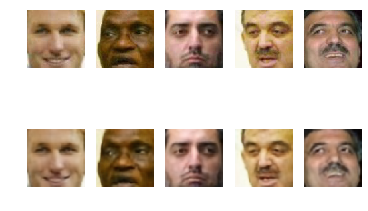

9500 [Train loss: 0.588810] [Val loss: 0.595547]


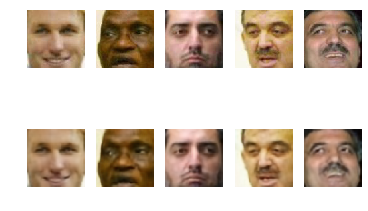

9600 [Train loss: 0.592116] [Val loss: 0.594207]


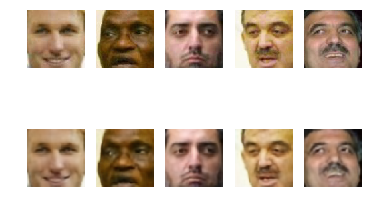

9700 [Train loss: 0.584484] [Val loss: 0.598595]


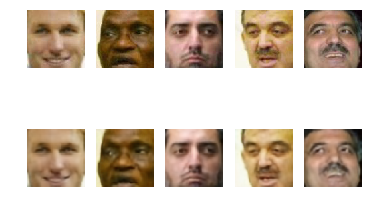

9800 [Train loss: 0.590836] [Val loss: 0.595534]


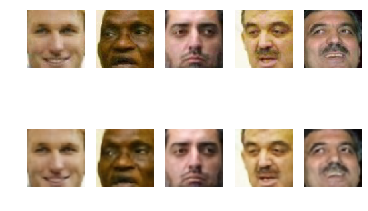

9900 [Train loss: 0.592612] [Val loss: 0.594260]


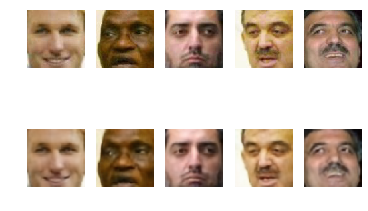

CPU times: user 1h 11min 51s, sys: 13min 21s, total: 1h 25min 12s
Wall time: 1h 32min 18s


In [0]:
%%time
t_loss, v_loss = ae.train(epochs=10000, save_imgs=True, sample_interval=100)

При желании можно собрать из сохраненных реконструкций (если они есть) gif

In [0]:
import os
import time
import glob
import PIL
import imageio

In [0]:
anim_file = 'ae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('/content/images/*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    image = imageio.imread(filename)
    writer.append_data(image)



Построим график функции потерь

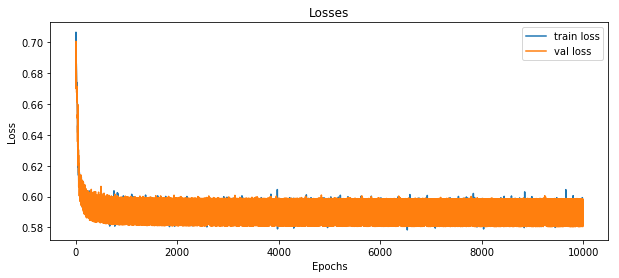

In [0]:
plt.figure(figsize=(10, 4))
plt.title("Losses")
plt.plot(t_loss, label="train loss")
plt.plot(v_loss, label="val loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend();

Сохраним обученную сеть

In [0]:
# Монтируем Google диск
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
ae.autoencoder.save('/content/gdrive/My Drive/Project DLSw3/Autoencoder/autoencoder.h5')

In [0]:
ae.autoencoder.save_weights('/content/gdrive/My Drive/Project DLSw3/Autoencoder/autoencoder_weights.h5')

Загрузим веса ранее обученного автоэнкодера (для теста)

In [0]:
# ae.autoencoder.load_weights('/content/gdrive/My Drive/Project DLSw3/Autoencoder/autoencoder_weights.h5')

## Шаг 3

Если вы смогли подобрать параметры сети и обучить ее, то пора начать играться =)

Играться можно так:

### Идея 1

Бывает очень интересно посмотреть на латентное пространство, которое получается у вашего автоэнкодера. На его структуру. Это можно сделать, воспользовавшись методами понижения размерности PCA и TSNE. Конкретнее:

1. Берете ваши картинки, прогоняет через encoder, получаете кучу латентных векторов некоторой размерности

2. На эти векторы глазами вы посмотреть не можете, потому что они более чем трехмерные. Поэтому нужно сжать их до размерности 2. Этим занимаются TSNE и PCA. Они есть в sklearn. Сжимаете ими векторы до размерности 2

3. Рисуете с помощью matplotlib картинку, где по оси Х первая из размерностей сжатого вектора, по оси У -- вторая

4. Примерно понимаете, как выглядит ваше скрытое пространство : ) оно будет ооочень разным для обычного AE и VAE

In [0]:
from sklearn.manifold import TSNE

Получаем кучу латентных векторов из валидационной выборки




In [0]:
x_lat_ae = ae.encoder.predict_generator(val_generator, steps=12)

In [0]:
x_lat_ae.shape

(1528, 768)

Понижаем размерность

In [0]:
x_embedded_ae = TSNE(n_components=2).fit_transform(x_lat_ae)

In [0]:
x_embedded_ae.shape

(1528, 2)

Рисуем и смотрим

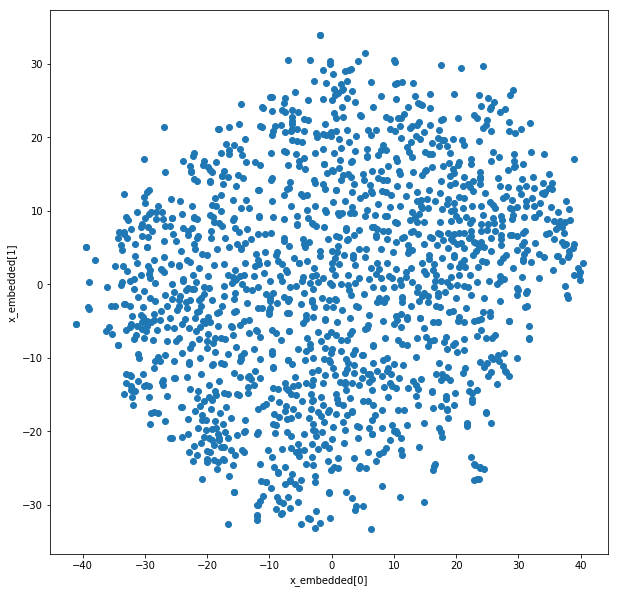

In [0]:
plt.figure(figsize=(10, 10))
plt.scatter(x_embedded_ae[:, 0], x_embedded_ae[:, 1])
plt.xlabel("x_embedded[0]")
plt.ylabel("x_embedded[1]")
plt.savefig('ae_val_lat.png')
plt.show()

Получаем кучу латентных векторов из обучающей выборки




In [0]:
x_lat_ae = ae.encoder.predict_generator(train_generator, steps=92)

In [0]:
x_lat_ae.shape

(11705, 768)

Понижаем размерность

In [0]:
x_embedded_ae = TSNE(n_components=2).fit_transform(x_lat_ae)

In [0]:
x_embedded_ae.shape

(11705, 2)

Рисуем и смотрим

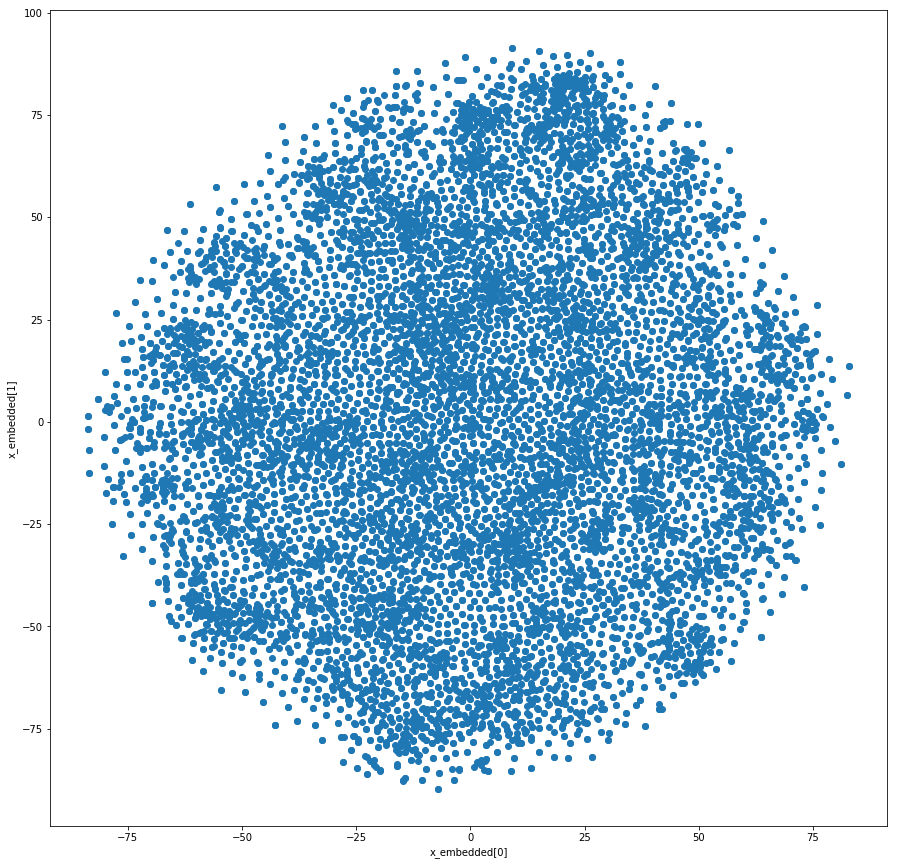

In [0]:
plt.figure(figsize=(15, 15))
plt.scatter(x_embedded_ae[:, 0], x_embedded_ae[:, 1])
plt.xlabel("x_embedded[0]")
plt.ylabel("x_embedded[1]")
plt.savefig('ae_train_lat.png')
plt.show()

Точки разбросаны внутри довольно большой области радиусом больше 75. Некоторые объединяются в небольшие группы (элементы чуть плотнее расположены). Классов в данном датасете очень много, некоторые из них содержат по несколько элементов. Думаю, что именно элементы из одного класса и образуют чуть более плотные группы. В целом же полученное пространство разрежено. Если взять какую-то точку из данного множества, то совсем необязательно соседние с ней точки также в него попадут (т.е. будут переводиться декодером в лицо).



### Идея 2

А почему бы не использовать PCA или TSNE для сжатия картинок?) И сравнить со своим AE

In [0]:
from sklearn.manifold import TSNE

Возьмем исходные картинки, например, из валидационной выборки

In [0]:
x_lat = next(val_generator)
for i in range(11):
  x = next(val_generator)
  x_lat = np.concatenate((x_lat, x), axis=0)

In [0]:
x_lat.shape

(1528, 64, 64, 3)

In [0]:
x_flat = x_lat.reshape((-1, img_rows*img_cols*3))

In [0]:
x_flat.shape

(1528, 12288)

Сожмем их до размерности 2 с помощью TSNE (без предварительного сжатия энкодером)

In [0]:
x_embedded = TSNE(n_components=2).fit_transform(x_flat)

In [0]:
x_embedded.shape

(1528, 2)

Выведем и посмотрим

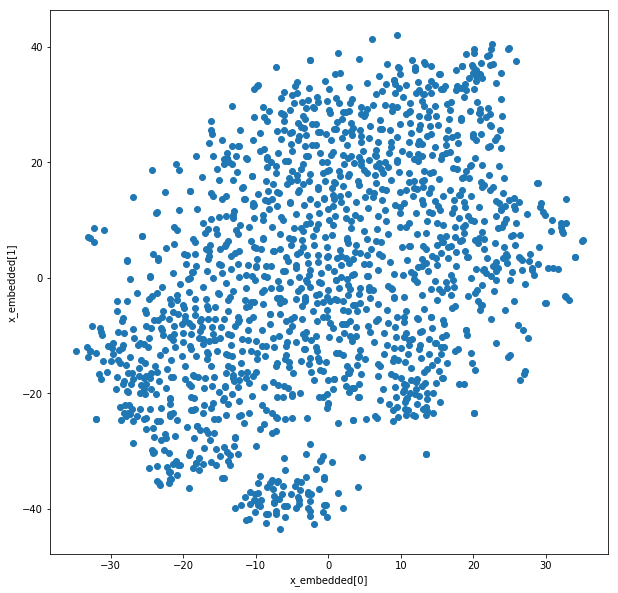

In [0]:
plt.figure(figsize=(10, 10))
plt.scatter(x_embedded[:, 0], x_embedded[:, 1])
plt.xlabel("x_embedded[0]")
plt.ylabel("x_embedded[1]")
plt.savefig('TSNE_val.png')
plt.show()

Проделаем то же самое для обучающей выборки

In [0]:
x_lat = next(train_generator)
for i in range(91):
  x = next(train_generator)
  x_lat = np.concatenate((x_lat, x), axis=0)

In [0]:
x_lat.shape

(11705, 64, 64, 3)

In [0]:
x_flat = x_lat.reshape((-1, img_rows*img_cols*3))

In [0]:
x_flat.shape

(11705, 12288)

In [0]:
x_embedded = TSNE(n_components=2).fit_transform(x_flat)

In [0]:
x_embedded.shape

(11705, 2)

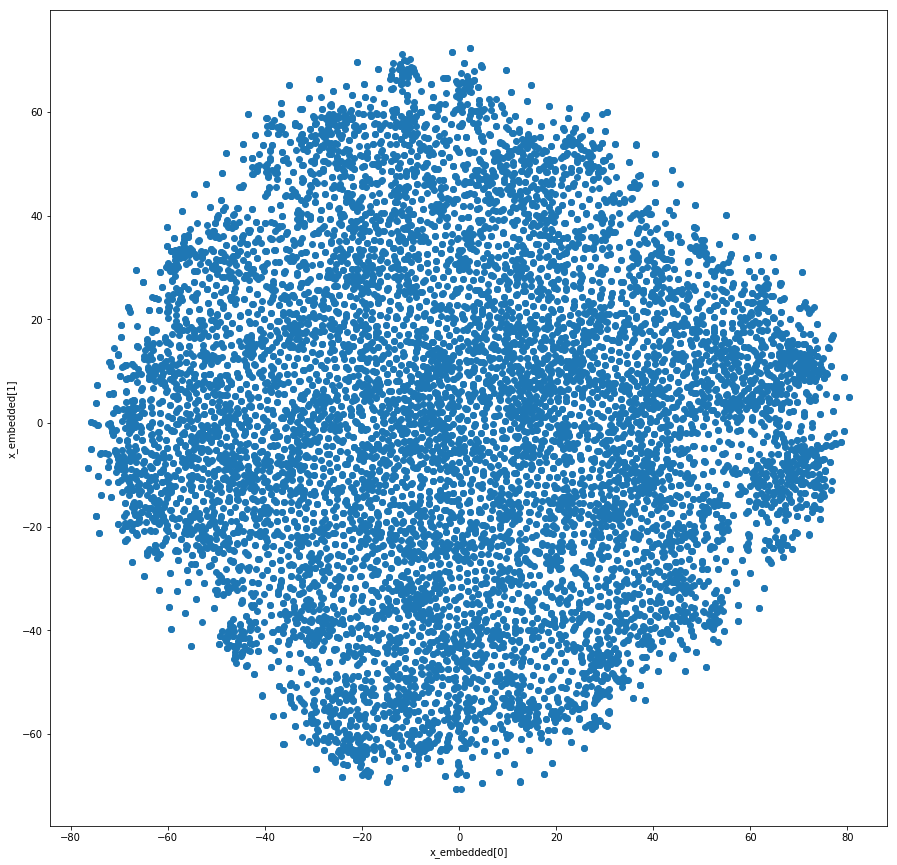

In [0]:
plt.figure(figsize=(15, 15))
plt.scatter(x_embedded[:, 0], x_embedded[:, 1])
plt.xlabel("x_embedded[0]")
plt.ylabel("x_embedded[1]")
plt.savefig('TSNE_train.png')
plt.show()

Очень похоже на латентное пространство автоэнкодера.

### Идея 3

Смотрите, ваш AE научился на реальных фотках людей и ожидает на вход реальные фотки. А что если подать ему фотку человека с, например, замазанным ртом?) Берете и вместо рта пихаете черный квадрат. Что сделает AE?

P.S. если пихнуть квартат чуть выше рта, получите одного известного персонажа

Создаем батч из измененных изображений

In [0]:
arn_batch = []
for i in range(5):
  img = load_img('/content/gdrive/My Drive/Project DLSw3/Autoencoder/Arnold/Arnold_Schwarzenegger_0012_{}.jpg'.format(i), target_size=(rows, cols))
  x = img_to_array(img) / 255.
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  arn_batch.append(x)

In [0]:
arn_batch = np.array(arn_batch)
arn_batch.shape

(5, 64, 64, 3)

Пропустим через автоэнкодер

In [0]:
arn_dec = ae.autoencoder.predict(arn_batch)

Посмотрим на результат

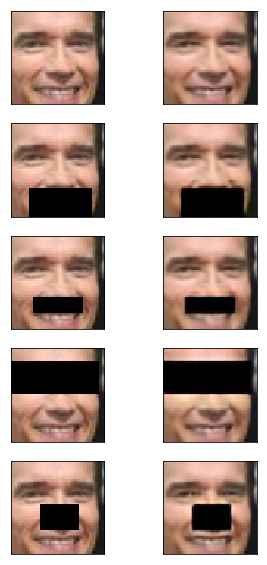

In [0]:
n=5
plt.figure(figsize=(5, 10))
for i in range(n):
  plt.subplot(n,2,2*i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(arn_batch[i])
  plt.subplot(n,2,2*i+2)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(arn_dec[i])


Так и остался черный прямоугольник...

### Идея 4

Вот есть два разных человека. Например, Путин и Ким Чен Ын. Для них есть два латентных вектора. Что будет, если начать с одного вектора и начать от него двигаться ко второму?) 
Сравните, что получится для AE и VAE и в купе 1 пунктом (там, где надо смотреть на латентные векторы), ответьте на вопрос, почему результаты для AE и VAE такие разные

Возьмем два разных изображения

(64, 64, 3)


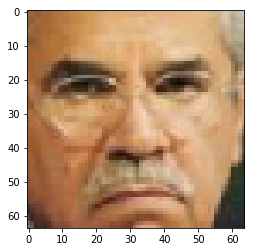

In [0]:
x1 = x_test[33]
print(x1.shape)
plt.imshow(x1)

In [0]:
np.expand_dims(x1, 0).shape

(1, 64, 64, 3)

Получим латентный вектор для первого

In [0]:
y1 = ae.encoder.predict(np.expand_dims(x1, 0))

In [0]:
y1.shape

(1, 768)

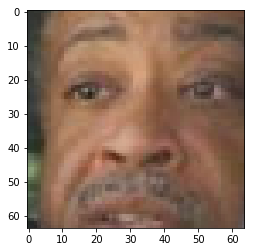

In [0]:
x2 = x_test[16]
plt.imshow(x2)

In [0]:
np.expand_dims(x2, 0).shape

(1, 64, 64, 3)

И латентный вектор для второго

In [0]:
y2 = ae.encoder.predict(np.expand_dims(x2, 0))

In [0]:
y2.shape

(1, 768)

Построим промежуточные вектора при движении от первого ко второму

In [0]:
n = 25  

z = [0 for i in range(ae.latent_dim)]
for i in range(ae.latent_dim):
  z[i] = np.linspace(y1[0][i], y2[0][i], n)

In [0]:
z = np.array(z)

In [0]:
z = np.transpose(z)

Получим реконструкции

In [0]:
z_dec = ae.decoder.predict(z)

Посмотрим, что получилось

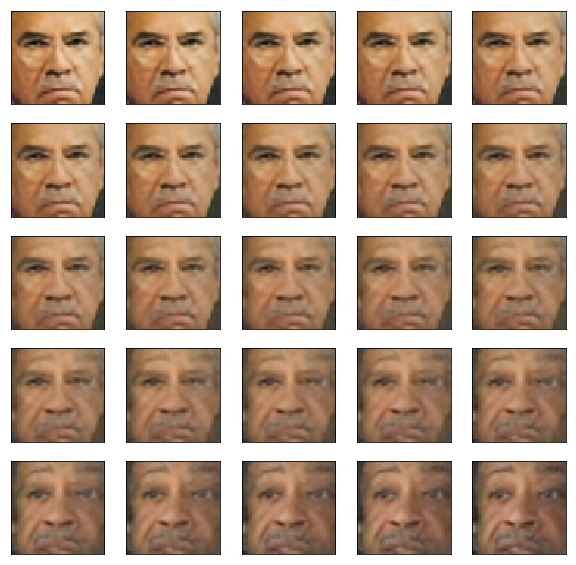

In [0]:
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(z_dec[i])

И еще пример

(64, 64, 3)


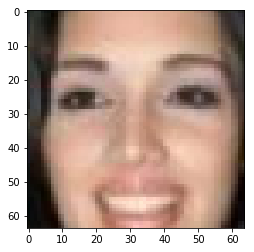

In [0]:
x1 = x_test[46]
print(x1.shape)
plt.imshow(x1)

In [0]:
np.expand_dims(x1, 0).shape

(1, 64, 64, 3)

In [0]:
y1 = ae.encoder.predict(np.expand_dims(x1, 0))

In [0]:
y1.shape

(1, 768)

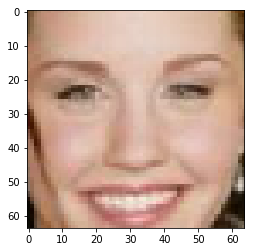

In [0]:
x2 = x_test[45]
plt.imshow(x2)

In [0]:
np.expand_dims(x2, 0).shape

(1, 64, 64, 3)

In [0]:
y2 = ae.encoder.predict(np.expand_dims(x2, 0))

In [0]:
y2.shape

(1, 768)

In [0]:
n = 25

z = [0 for i in range(ae.latent_dim)]
for i in range(ae.latent_dim):
  z[i] = np.linspace(y1[0][i], y2[0][i], n)

In [0]:
z = np.array(z)

In [0]:
z = np.transpose(z)

In [0]:
z_dec = ae.decoder.predict(z)

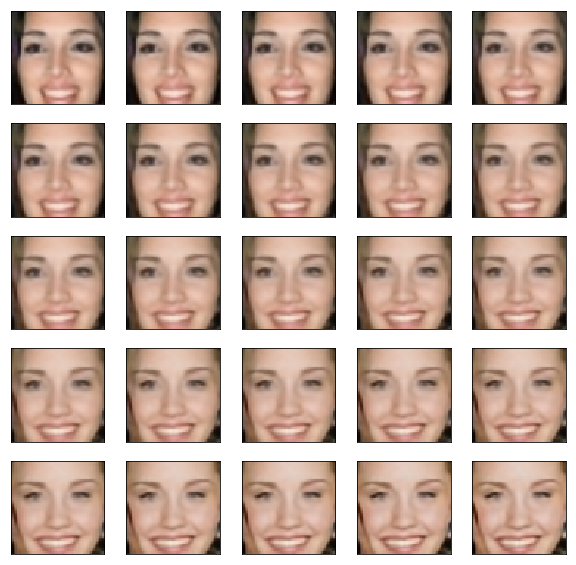

In [0]:
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(z_dec[i])

Похоже на то, как будто два исходных изображения наложили друг на друга. Сначала одно из них было видимым, а другое прозрачным. А потом постепенно прозрачным становится первое, а второе проявляется.

### Рандомные вектора

а) сгенерировать рандомные латентные векторы (без энкодера, например, с помощью np.random.randn), скормить их decoder'у и посмотреть, что получится. То есть, вы сможете создавать новые лица людей из векторов

Сгенерируем батч из рандомных векторов

In [0]:
noise = np.random.rand(batch_size, ae.latent_dim)

Пропустим через декодер

In [0]:
dec_imgs = ae.decoder.predict(noise)

Посмотрим на результат

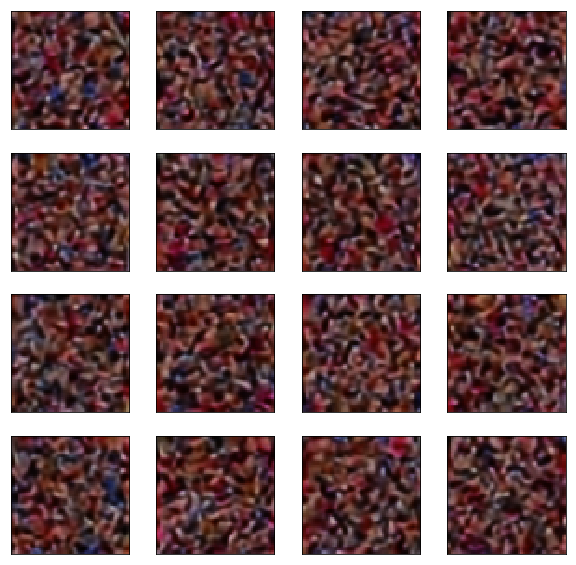

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(dec_imgs[i])

Сгенерируем батч из рандомных нормальных векторов

In [0]:
noise = np.random.randn(batch_size, ae.latent_dim)

Пропустим через декодер

In [0]:
dec_imgs = ae.decoder.predict(noise)

Посмотрим на результат

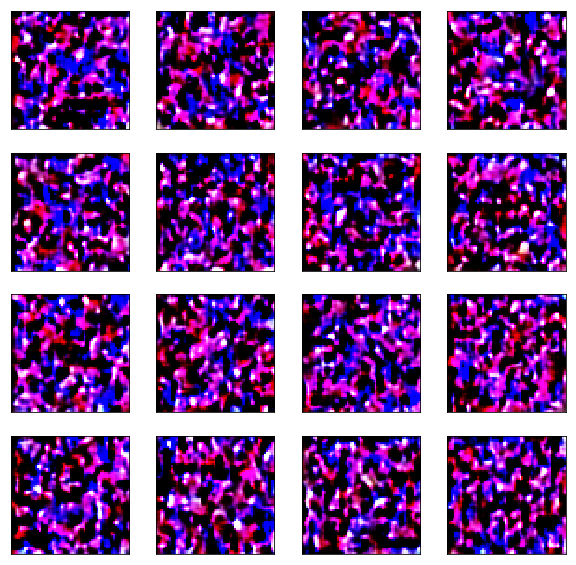

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(dec_imgs[i])

На лица не похоже, но это и понятно. Латентное пространство  у автоэнкодера слишком разрежено. Поэтому шанс попасть в точку знакомую для автоэнкодера (которую он декодирует как лицо) очень мал.

### Улыбка

б) Второе, что предлагается сделать -- научить лепить улыбки на лица грустных людей.

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear">

План такой:

1) Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15 сойдет) людей с улыбками и столько же без

2) Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3) Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

3) А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного чувака и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии)

Информацию о грустных и улыбающихся людях получим из файла *lfw_attributes.txt*

In [0]:
import pandas as pd

In [0]:
attr = pd.read_csv('/content/lfw_attributes.txt', sep='\t', skiprows=1)

In [0]:
attr.head()

,#,person,imagenum,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,Blond Hair,Brown Hair,Bald,No Eyewear,Eyeglasses,Sunglasses,Mustache,Smiling,Frowning,Chubby,Blurry,Harsh Lighting,Flash,Soft Lighting,Outdoor,Curly Hair,Wavy Hair,Straight Hair,Receding Hairline,Bangs,Sideburns,Fully Visible Forehead,Partially Visible Forehead,Obstructed Forehead,Bushy Eyebrows,Arched Eyebrows,Narrow Eyes,Eyes Open,Big Nose,Pointy Nose,Big Lips,Mouth Closed,Mouth Slightly Open,Mouth Wide Open,Teeth Not Visible,No Beard,Goatee,Round Jaw,Double Chin,Wearing Hat,Oval Face,Square Face,Round Face,Color Photo,Posed Photo,Attractive Man,Attractive Woman,Indian,Gray Hair,Bags Under Eyes,Heavy Makeup,Rosy Cheeks,Shiny Skin,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,Aaron Eckhart,1,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.195580,-0.835609,-0.351468,-1.012533,-0.719593,-0.632401,0.464839,-0.973528,1.565186,-1.296704,-1.542719,-0.684671,-0.864990,0.766886,-0.218952,-1.655665,-0.787044,-0.599665,0.458519,0.189760,0.851555,-0.385720,-0.497719,-0.161149,-0.257514,-0.088839,0.455469,-0.839211,-0.022948,-0.922568,-0.114539,1.461222,1.758481,0.068894,1.267860,-1.120244,0.917617,-1.307957,-1.500413,1.029221,0.832363,-0.498657,0.251365,-0.705281,-0.515715,0.374239,-0.168675,-0.614143,3.097703,1.523858,0.779278,-0.071454,-1.246483,-0.769283,-0.725597,-1.820610,-2.072977,-0.960759,0.361738,1.166118,-1.164916,-1.139990,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609,NaN
1,Aaron Guiel,1,0.169851,-0.982408,0.422709,-1.282184,-1.360060,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,-0.736883,0.294554,-1.277647,0.954771,-0.990992,-1.167359,-0.835146,0.798544,-0.971679,0.342826,-1.322562,0.962937,-1.199363,-0.157307,0.443224,-0.002882,-0.021158,-0.226563,-0.081039,-0.827202,-0.106624,1.227594,-0.812223,-1.241258,0.096272,-0.404544,0.325919,0.474452,1.135359,0.058725,0.611176,-1.172510,0.428512,-0.874235,-1.191565,0.192359,-0.204166,0.342347,0.239512,-1.474690,0.236057,-0.565208,-0.712542,2.997076,-0.273306,-0.187722,-0.604608,-1.321701,-0.938559,0.494294,-0.659043,-1.143747,-0.775722,-0.832036,-0.397680,0.874160,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.666760,-0.496559,NaN
2,Aaron Patterson,1,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,-1.200725,-0.332460,-0.537006,1.298364,-1.498471,-1.285823,1.141742,0.172817,0.106412,-0.788843,0.349295,-1.643716,0.454287,1.189458,-0.688414,-0.590574,-0.266673,0.467224,0.567348,-1.719101,0.124667,1.602741,-0.659399,-1.753762,1.204473,0.022188,-1.135443,1.702857,-0.422144,0.587859,0.414363,0.344447,-1.260451,-0.577746,0.405567,-1.916545,0.921260,0.247437,-0.428451,-0.772273,0.370673,-0.509596,-0.768482,1.706897,0.126524,-0.497001,-0.393042,-0.178307,-1.180227,-0.596914,-1.805382,-0.951643,-0.838087,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231,NaN
3,Aaron Peirsol,1,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,-0.070519,-0.339239,-2.004149,0.665695,-0.775940,-1.471629,-1.179080,0.563327,-0.664429,-1.407928,0.435594,-0.589988,-1.603498,1.170741,0.760103,0.211498,-0.516180,-1.331146,0.202840,0.149645,-0.046430,0.640885,-0.107616,-0.831271,-0.827005,-0.588725,0.429255,1.587664,0.499086,-0.056869,-0.866643,-0.959689,0.350730,-1.335354,-0.427890,0.826817,-0.256779,0.149751,-1.201531,-1.083917,0.255363,-0.650423,-0.506293,1.101592,0.640783,1.575028,-0.484397,-1.559682,-1.437124,0.379363,-0.648233,-2.257352,-1.075613,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025,NaN
4,Aaron Peirsol,2,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,-0.568057,0.840375,-1.981269,1.666710,-0.910723,-1.993509,-0.871335,0.507786,-0.488947,-0.886490

Заголовки колонок сдвинуты, исправим это

In [0]:
columns = attr.columns[1:]

In [0]:
attr = attr.iloc[:, :-1]

In [0]:
attr.columns = columns

In [0]:
attr.head()

,person,imagenum,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,Blond Hair,Brown Hair,Bald,No Eyewear,Eyeglasses,Sunglasses,Mustache,Smiling,Frowning,Chubby,Blurry,Harsh Lighting,Flash,Soft Lighting,Outdoor,Curly Hair,Wavy Hair,Straight Hair,Receding Hairline,Bangs,Sideburns,Fully Visible Forehead,Partially Visible Forehead,Obstructed Forehead,Bushy Eyebrows,Arched Eyebrows,Narrow Eyes,Eyes Open,Big Nose,Pointy Nose,Big Lips,Mouth Closed,Mouth Slightly Open,Mouth Wide Open,Teeth Not Visible,No Beard,Goatee,Round Jaw,Double Chin,Wearing Hat,Oval Face,Square Face,Round Face,Color Photo,Posed Photo,Attractive Man,Attractive Woman,Indian,Gray Hair,Bags Under Eyes,Heavy Makeup,Rosy Cheeks,Shiny Skin,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,Aaron Eckhart,1,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.195580,-0.835609,-0.351468,-1.012533,-0.719593,-0.632401,0.464839,-0.973528,1.565186,-1.296704,-1.542719,-0.684671,-0.864990,0.766886,-0.218952,-1.655665,-0.787044,-0.599665,0.458519,0.189760,0.851555,-0.385720,-0.497719,-0.161149,-0.257514,-0.088839,0.455469,-0.839211,-0.022948,-0.922568,-0.114539,1.461222,1.758481,0.068894,1.267860,-1.120244,0.917617,-1.307957,-1.500413,1.029221,0.832363,-0.498657,0.251365,-0.705281,-0.515715,0.374239,-0.168675,-0.614143,3.097703,1.523858,0.779278,-0.071454,-1.246483,-0.769283,-0.725597,-1.820610,-2.072977,-0.960759,0.361738,1.166118,-1.164916,-1.139990,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609
1,Aaron Guiel,1,0.169851,-0.982408,0.422709,-1.282184,-1.360060,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,-0.736883,0.294554,-1.277647,0.954771,-0.990992,-1.167359,-0.835146,0.798544,-0.971679,0.342826,-1.322562,0.962937,-1.199363,-0.157307,0.443224,-0.002882,-0.021158,-0.226563,-0.081039,-0.827202,-0.106624,1.227594,-0.812223,-1.241258,0.096272,-0.404544,0.325919,0.474452,1.135359,0.058725,0.611176,-1.172510,0.428512,-0.874235,-1.191565,0.192359,-0.204166,0.342347,0.239512,-1.474690,0.236057,-0.565208,-0.712542,2.997076,-0.273306,-0.187722,-0.604608,-1.321701,-0.938559,0.494294,-0.659043,-1.143747,-0.775722,-0.832036,-0.397680,0.874160,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.666760,-0.496559
2,Aaron Patterson,1,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,-1.200725,-0.332460,-0.537006,1.298364,-1.498471,-1.285823,1.141742,0.172817,0.106412,-0.788843,0.349295,-1.643716,0.454287,1.189458,-0.688414,-0.590574,-0.266673,0.467224,0.567348,-1.719101,0.124667,1.602741,-0.659399,-1.753762,1.204473,0.022188,-1.135443,1.702857,-0.422144,0.587859,0.414363,0.344447,-1.260451,-0.577746,0.405567,-1.916545,0.921260,0.247437,-0.428451,-0.772273,0.370673,-0.509596,-0.768482,1.706897,0.126524,-0.497001,-0.393042,-0.178307,-1.180227,-0.596914,-1.805382,-0.951643,-0.838087,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231
3,Aaron Peirsol,1,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,-0.070519,-0.339239,-2.004149,0.665695,-0.775940,-1.471629,-1.179080,0.563327,-0.664429,-1.407928,0.435594,-0.589988,-1.603498,1.170741,0.760103,0.211498,-0.516180,-1.331146,0.202840,0.149645,-0.046430,0.640885,-0.107616,-0.831271,-0.827005,-0.588725,0.429255,1.587664,0.499086,-0.056869,-0.866643,-0.959689,0.350730,-1.335354,-0.427890,0.826817,-0.256779,0.149751,-1.201531,-1.083917,0.255363,-0.650423,-0.506293,1.101592,0.640783,1.575028,-0.484397,-1.559682,-1.437124,0.379363,-0.648233,-2.257352,-1.075613,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,Aaron Peirsol,2,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,-0.568057,0.840375,-1.981269,1.666710,-0.910723,-1.993509,-0.871335,0.507786,-0.488947,-0.886490,-0.990132,-0.7508

Найдем имя колонки, отвечающей за улыбку

In [0]:
attr.columns

Index(['person', 'imagenum', 'Male', 'Asian', 'White', 'Black', 'Baby',
       'Child', 'Youth', 'Middle Aged', 'Senior', 'Black Hair', 'Blond Hair',
       'Brown Hair', 'Bald', 'No Eyewear', 'Eyeglasses', 'Sunglasses',
       'Mustache', 'Smiling', 'Frowning', 'Chubby', 'Blurry', 'Harsh Lighting',
       'Flash', 'Soft Lighting', 'Outdoor', 'Curly Hair', 'Wavy Hair',
       'Straight Hair', 'Receding Hairline', 'Bangs', 'Sideburns',
       'Fully Visible Forehead', 'Partially Visible Forehead',
       'Obstructed Forehead', 'Bushy Eyebrows', 'Arched Eyebrows',
       'Narrow Eyes', 'Eyes Open', 'Big Nose', 'Pointy Nose', 'Big Lips',
       'Mouth Closed', 'Mouth Slightly Open', 'Mouth Wide Open',
       'Teeth Not Visible', 'No Beard', 'Goatee', 'Round Jaw', 'Double Chin',
       'Wearing Hat', 'Oval Face', 'Square Face', 'Round Face', 'Color Photo',
       'Posed Photo', 'Attractive Man', 'Attractive Woman', 'Indian',
       'Gray Hair', 'Bags Under Eyes', 'Heavy Makeup', 'Rosy Chee

И отсортируем по ней табличку из файла

In [0]:
sort_attr = attr.sort_values(by='Smiling')

Отберем 16 самых улыбающихся

In [0]:
smiling = sort_attr.iloc[-16:, [0, 1, 19]]

In [0]:
smiling

,person,imagenum,Smiling
983,Ashlea Talbot,1,2.610540
682,Anita DeFrantz,1,2.639694
6166,Jennifer Renee Short,1,2.651704
459,Amelia Vega,4,2.659124
9004,Michelle Rodriguez,1,2.664156
1955,Cheryl James,1,2.669922
2031,Christina Sawaya,1,2.670851
1359,Blythe Hartley,1,2.677178
11797,Susie Castillo,2,2.683156
6139,Jennifer Lopez,1,2.716630


Сформируем из них батч для подачи нашей модели (не забываем про resize и нормировку, а также центральный кроп)

In [0]:
dir = '/content/lfw-deepfunneled/'
smiling_batch = []
for i in range(16):
  person = smiling['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = smiling['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  smiling_batch.append(x)

In [0]:
smiling_batch = np.array(smiling_batch)

Посмотрим на этих улыбающихся людей

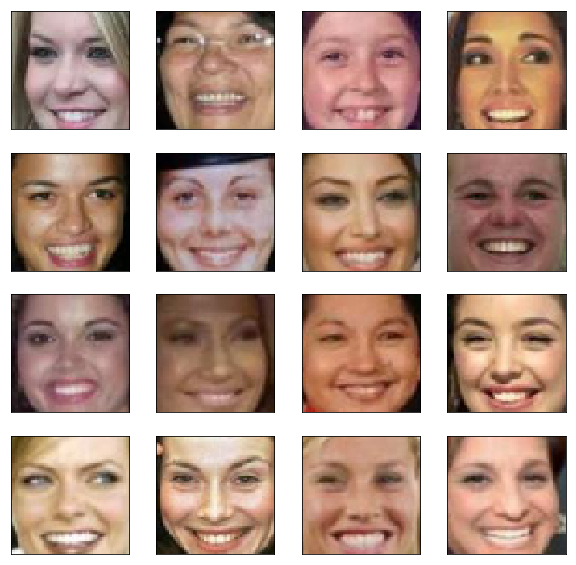

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(smiling_batch[i])

In [0]:
smiling_batch.shape

(16, 64, 64, 3)

In [0]:
smiling_latent = ae.encoder.predict(smiling_batch)

In [0]:
smiling_latent.shape

(16, 768)

Вычислим средний латентный вектор улыбающихся людей

In [0]:
smiling_mean = smiling_latent.mean(axis=0)

In [0]:
smiling_mean.shape

(768,)

Проделаем то же самое для грустных людей

In [0]:
sad = sort_attr.iloc[:16, [0, 1, 19]]

In [0]:
sad

,person,imagenum,Smiling
11571,Sohail Abbas,1,-2.686594
1234,Bill Elliott,1,-2.664484
7506,Kimi Raikkonen,3,-2.643547
5458,Irina Framtsova,1,-2.639749
7065,Juan Ignacio Chela,1,-2.630769
11912,Taufik Hidayat,1,-2.589319
1654,Carlo Ancelotti,3,-2.589131
471,Amelie Mauresmo,9,-2.555868
8410,Maria Shkolnikova,1,-2.542728
8596,Martin McGuinness,2,-2.541024


In [0]:
dir = '/content/lfw-deepfunneled/'
sad_batch = []
for i in range(16):
  person = sad['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = sad['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  sad_batch.append(x)

In [0]:
sad_batch = np.array(sad_batch)

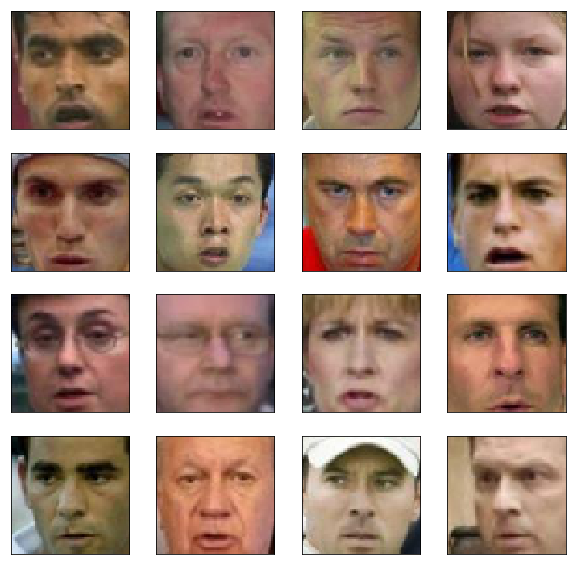

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_batch[i])

In [0]:
sad_batch.shape

(16, 64, 64, 3)

In [0]:
sad_latent = ae.encoder.predict(sad_batch)

In [0]:
sad_latent.shape

(16, 768)

In [0]:
sad_mean = sad_latent.mean(axis=0)

In [0]:
sad_mean.shape

(768,)

Вычислим вектор улыбки

In [0]:
SMILE = smiling_mean - sad_mean

Добавим улыбку грустным людям

In [0]:
sad_plus_smile_latent = sad_latent + SMILE

In [0]:
sad_plus_smile_latent = sad_plus_smile_latent.reshape((-1, ae.latent_dim))

In [0]:
sad_plus_smile = ae.decoder.predict(sad_plus_smile_latent)

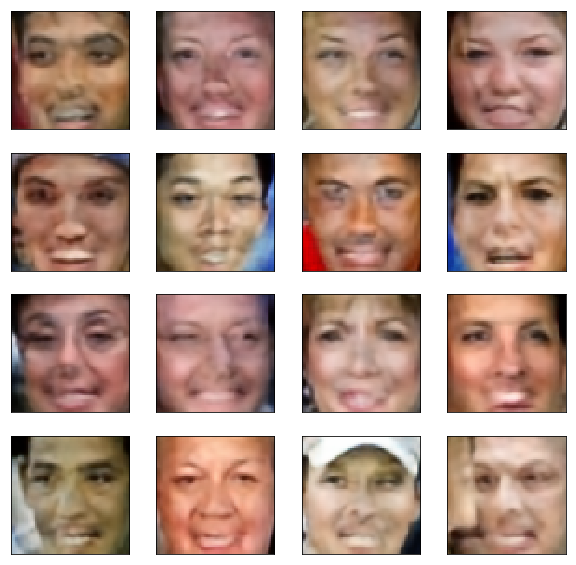

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_plus_smile[i])

Страшненькие, но уже не такие грустненькие))

Из любопытства посмотрим, что возвращает декодер по средним векторам и вектору улыбки

Так выглядит средний улыбающийся человек

In [0]:
dec_smiling_mean = ae.decoder.predict(smiling_mean.reshape(-1, ae.latent_dim))

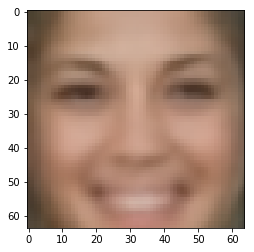

In [0]:
plt.imshow(dec_smiling_mean[0])

Так средний грустный

In [0]:
dec_sad_mean = ae.decoder.predict(sad_mean.reshape(-1, ae.latent_dim))

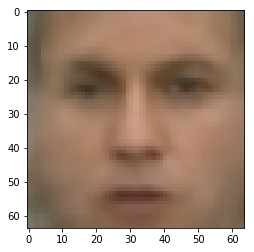

In [0]:
plt.imshow(dec_sad_mean[0])

Это разность между декодированными средними

W0627 17:49:55.720576 140711789070208 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


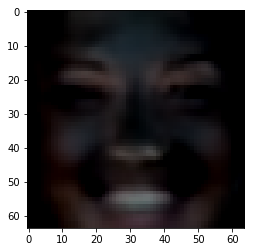

In [0]:
plt.imshow(dec_smiling_mean[0] - dec_sad_mean[0])

А это декодированная разность (декодированный латентный вектор улыбки без добавления лица)

In [0]:
dec_SMILE = ae.decoder.predict(SMILE.reshape(-1, ae.latent_dim))

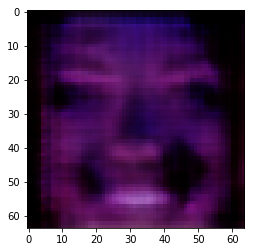

In [0]:
plt.imshow(dec_SMILE[0])

Среднее улыбающеся лицо получилось женским, а грустное мужским. Возможно, для улучшения результата, стоило брать людей одного пола (в идеале еще, чтобы лица смотрели в одну сторону и рот был на одном уровне)

#### Женская улыбка

Проделаем то же самое, но только для женщин

In [0]:
sort_attr = attr[attr['Male'] < -0.5].sort_values(by='Smiling')

Улыбающиеся женщины

In [0]:
smiling = sort_attr.iloc[-16:, [0, 1, 19]]

In [0]:
dir = '/content/lfw-deepfunneled/'
smiling_batch = []
for i in range(16):
  person = smiling['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = smiling['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  smiling_batch.append(x)

In [0]:
smiling_batch = np.array(smiling_batch)

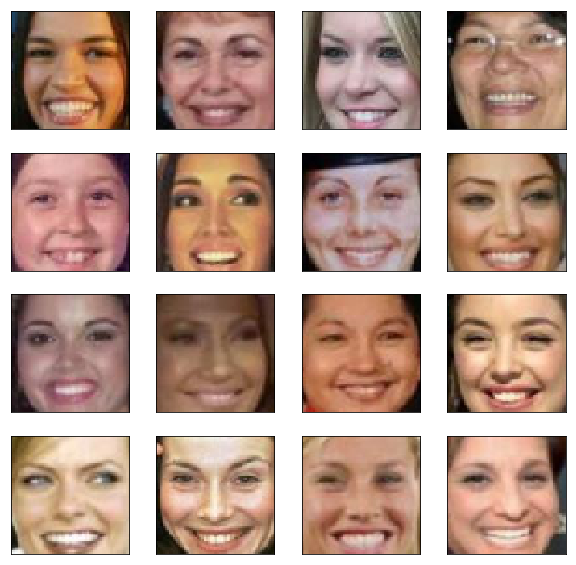

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(smiling_batch[i])

In [0]:
smiling_latent = ae.encoder.predict(smiling_batch)

In [0]:
smiling_mean = smiling_latent.mean(axis=0)

Грустные женщины

In [0]:
sad = sort_attr.iloc[4:20, [0, 1, 19]]

In [0]:
dir = '/content/lfw-deepfunneled/'
sad_batch = []
for i in range(16):
  person = sad['person'].iloc[i]
  person = person.replace(' ', '_')  
  num = sad['imagenum'].iloc[i]
  img = load_img(dir+person+'/'+person+'_{0:04d}'.format(num)+'.jpg', target_size=(rows, cols))
  # Нормировка
  x = img_to_array(img) / 255.
  # Центральный кроп
  x = x[crop_dx:-crop_dx, crop_dy:-crop_dy, :]
  sad_batch.append(x)

In [0]:
sad_batch = np.array(sad_batch)

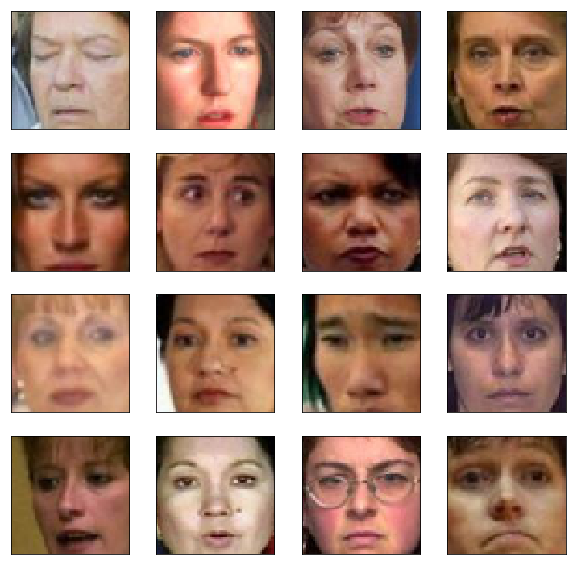

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_batch[i])

In [0]:
sad_latent = ae.encoder.predict(sad_batch)

In [0]:
sad_mean = sad_latent.mean(axis=0)

Добавление улыбки

In [0]:
SMILE = smiling_mean - sad_mean

In [0]:
sad_plus_smile_latent = sad_latent + SMILE

In [0]:
sad_plus_smile_latent = sad_plus_smile_latent.reshape((-1, ae.latent_dim))

In [0]:
sad_plus_smile = ae.decoder.predict(sad_plus_smile_latent)

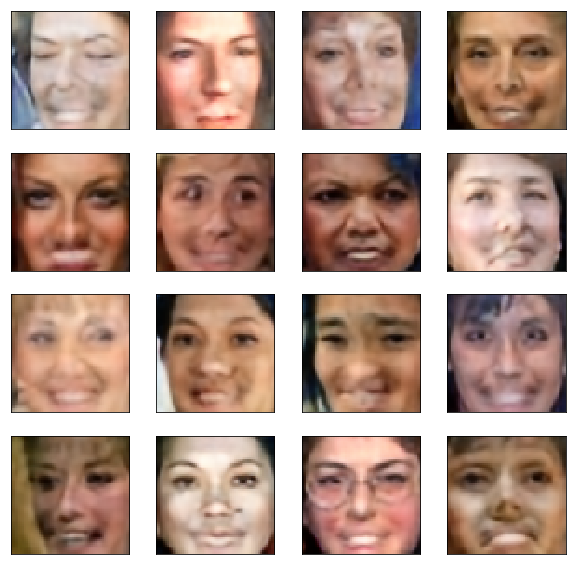

In [0]:
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sad_plus_smile[i])

Что ж, не всех легко осчастливить, но некоторых все-таки получилось.

Так теперь выглядит средний улыбающийся человек

In [0]:
dec_smiling_mean = ae.decoder.predict(smiling_mean.reshape(-1, ae.latent_dim))

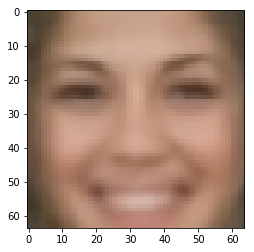

In [0]:
plt.imshow(dec_smiling_mean[0])

Так средний грустный

In [0]:
dec_sad_mean = ae.decoder.predict(sad_mean.reshape(-1, ae.latent_dim))

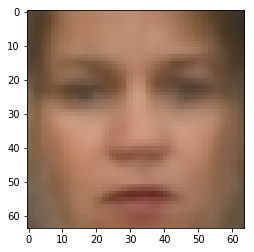

In [0]:
plt.imshow(dec_sad_mean[0])

Это разность между декодированными средними

W0627 17:54:37.753170 140711789070208 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


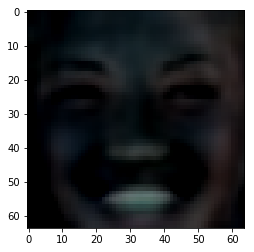

In [0]:
plt.imshow(dec_smiling_mean[0] - dec_sad_mean[0])

А это декодированная разность (декодированный латентный вектор улыбки без добавления лица)

In [0]:
dec_SMILE = ae.decoder.predict(SMILE.reshape(-1, ae.latent_dim))

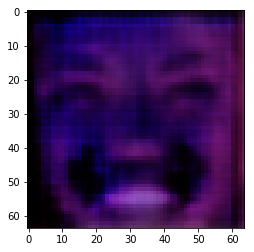

In [0]:
plt.imshow(dec_SMILE[0])